Importação de Bibliotecas

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import xgboost as xgb
from xgboost import XGBClassifier

In [3]:
# Configurações de visualização
plt.style.use('default')  # Usando o estilo padrão do matplotlib
sns.set_style('whitegrid')  # Configurando o estilo do seaborn
sns.set_palette('husl')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

Carregamento e Preparação Inicial dos Dados

In [4]:
url = "https://raw.githubusercontent.com/diogenesjusto/FIAP/master/dados/credit.csv"
dados_credito = pd.read_csv(url, encoding='ISO-8859-1', sep='\t', low_memory=False)

# Nomes das colunas
nomes_cols = ['ID_CLIENTE','TIPO_FUNCIONARIO','DIA_PAGAMENTO','TIPO_ENVIO_APLICACAO','QUANT_CARTOES_ADICIONAIS',
              'TIPO_ENDERECO_POSTAL','SEXO','ESTADO_CIVIL','QUANT_DEPENDENTES','NIVEL_EDUCACIONAL',
              'ESTADO_NASCIMENTO','CIDADE_NASCIMENTO','NACIONALIDADE','ESTADO_RESIDENCIAL','CIDADE_RESIDENCIAL',
              'BAIRRO_RESIDENCIAL','FLAG_TELEFONE_RESIDENCIAL','CODIGO_AREA_TELEFONE_RESIDENCIAL','TIPO_RESIDENCIA',
              'MESES_RESIDENCIA','FLAG_TELEFONE_MOVEL','FLAG_EMAIL','RENDA_PESSOAL_MENSAL','OUTRAS_RENDAS',
              'FLAG_VISA','FLAG_MASTERCARD','FLAG_DINERS','FLAG_AMERICAN_EXPRESS','FLAG_OUTROS_CARTOES',
              'QUANT_CONTAS_BANCARIAS','QUANT_CONTAS_BANCARIAS_ESPECIAIS','VALOR_PATRIMONIO_PESSOAL','QUANT_CARROS',
              'EMPRESA','ESTADO_PROFISSIONAL','CIDADE_PROFISSIONAL','BAIRRO_PROFISSIONAL','FLAG_TELEFONE_PROFISSIONAL',
              'CODIGO_AREA_TELEFONE_PROFISSIONAL','MESES_NO_TRABALHO','CODIGO_PROFISSAO','TIPO_OCUPACAO',
              'CODIGO_PROFISSAO_CONJUGE','NIVEL_EDUCACIONAL_CONJUGE','FLAG_DOCUMENTO_RESIDENCIAL','FLAG_RG',
              'FLAG_CPF','FLAG_COMPROVANTE_RENDA','PRODUTO','FLAG_REGISTRO_ACSP','IDADE','CEP_RESIDENCIAL',
              'CEP_PROFISSIONAL','ROTULO_ALVO_MAU']

dados_credito.columns = nomes_cols

Análise Exploratória Inicial

In [5]:
print(f"Número de linhas: {dados_credito.shape[0]}")
print(f"Número de colunas: {dados_credito.shape[1]}")
print("\nTipos de dados:")
print(dados_credito.dtypes.value_counts())

# Verificação de valores nulos
print("\nValores nulos por coluna:")
print(dados_credito.isnull().sum().sort_values(ascending=False))

# Distribuição da variável alvo
print("\nDistribuição da variável alvo (ROTULO_ALVO_MAU):")
print(dados_credito['ROTULO_ALVO_MAU'].value_counts(normalize=True))

Número de linhas: 49999
Número de colunas: 54

Tipos de dados:
int64      25
object     20
float64     9
Name: count, dtype: int64

Valores nulos por coluna:
CIDADE_PROFISSIONAL                  33782
BAIRRO_PROFISSIONAL                  33782
NIVEL_EDUCACIONAL_CONJUGE            32337
CODIGO_PROFISSAO_CONJUGE             28883
CODIGO_PROFISSAO                      7756
TIPO_OCUPACAO                         7313
MESES_RESIDENCIA                      3777
TIPO_RESIDENCIA                       1349
CODIGO_AREA_TELEFONE_PROFISSIONAL        0
QUANT_CONTAS_BANCARIAS_ESPECIAIS         0
VALOR_PATRIMONIO_PESSOAL                 0
QUANT_CARROS                             0
EMPRESA                                  0
ESTADO_PROFISSIONAL                      0
FLAG_TELEFONE_PROFISSIONAL               0
ID_CLIENTE                               0
MESES_NO_TRABALHO                        0
FLAG_OUTROS_CARTOES                      0
FLAG_DOCUMENTO_RESIDENCIAL               0
FLAG_RG                  

Análise Exploratória Detalhada

In [6]:
# Separando variáveis numéricas e categóricas
variaveis_numericas = dados_credito.select_dtypes(include=['int64', 'float64']).columns
variaveis_categoricas = dados_credito.select_dtypes(include=['object']).columns

print(f"Variáveis numéricas: {len(variaveis_numericas)}")
print(f"Variáveis categóricas: {len(variaveis_categoricas)}")

Variáveis numéricas: 34
Variáveis categóricas: 20


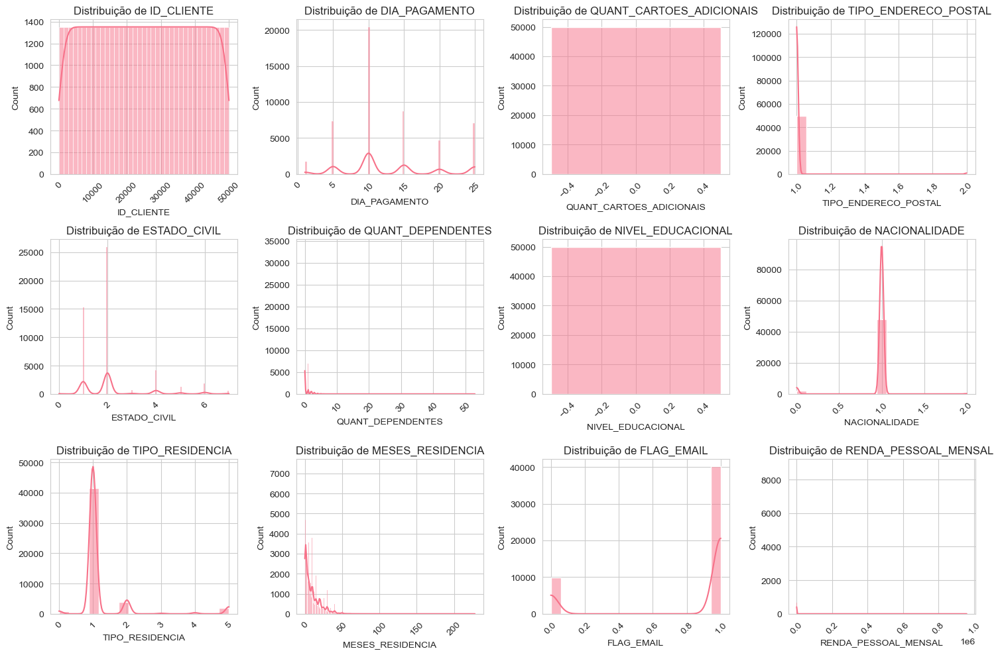

In [7]:
# Análise de distribuição das variáveis numéricas
plt.figure(figsize=(15, 10))
for i, col in enumerate(variaveis_numericas[:12]):  # Limitando a 12 variáveis para visualização
    plt.subplot(3, 4, i+1)
    sns.histplot(data=dados_credito, x=col, kde=True)
    plt.title(f'Distribuição de {col}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

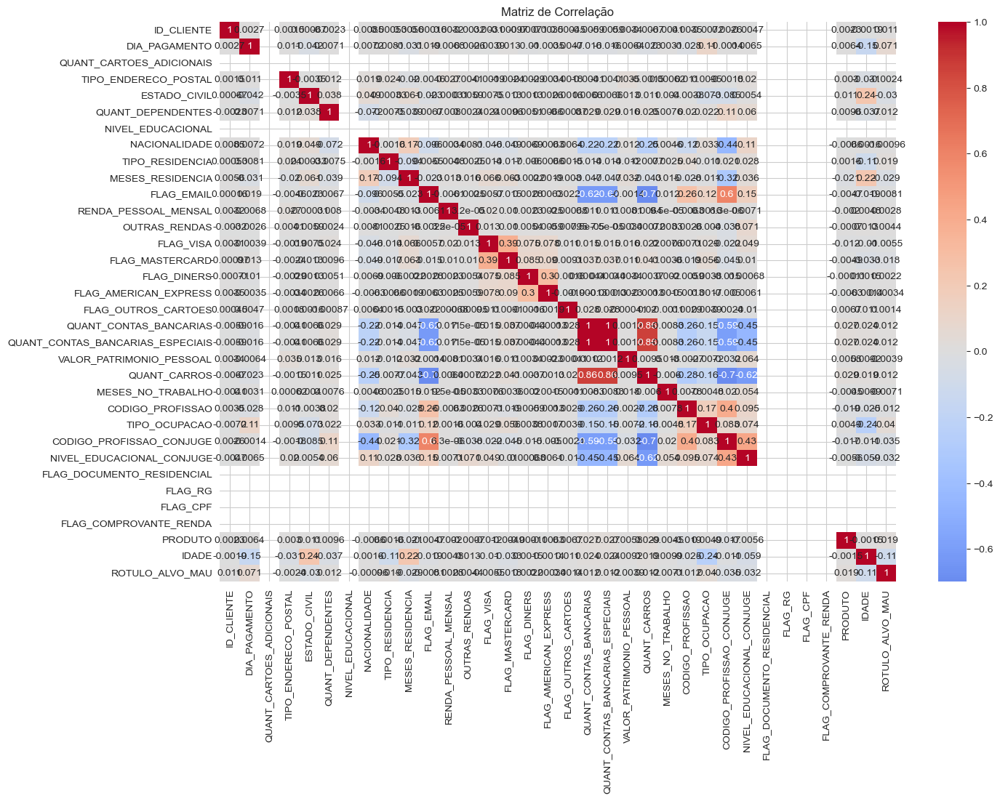

In [8]:
# Análise de correlação entre variáveis numéricas
plt.figure(figsize=(15, 10))
correlation_matrix = dados_credito[variaveis_numericas].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Matriz de Correlação')
plt.show()

Tratamento de Dados Faltantes

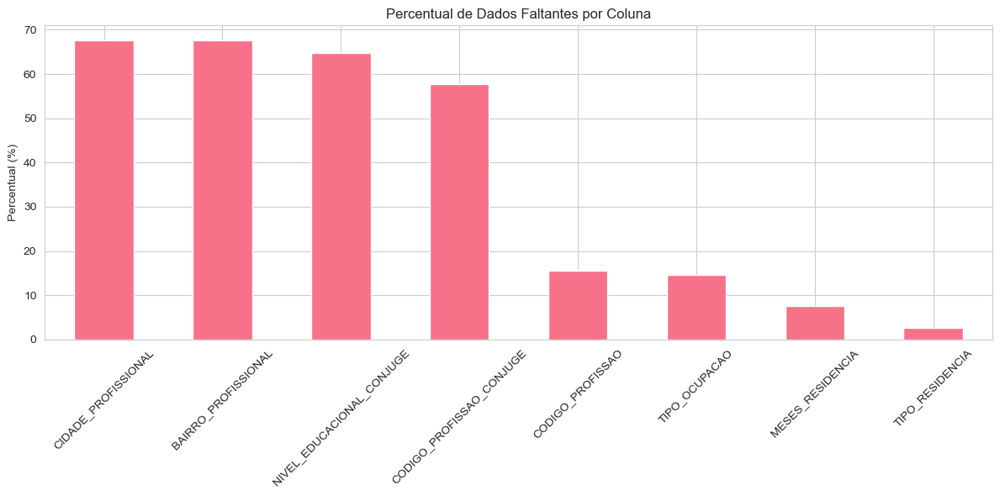

In [9]:
# Identificando percentual de dados faltantes por coluna
missing_data = dados_credito.isnull().sum() / len(dados_credito) * 100
missing_data = missing_data[missing_data > 0].sort_values(ascending=False)

plt.figure(figsize=(12, 6))
missing_data.plot(kind='bar')
plt.title('Percentual de Dados Faltantes por Coluna')
plt.ylabel('Percentual (%)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [10]:
# Função para imputação de dados faltantes
def imputar_dados_faltantes(df):
    # Criando cópia do dataframe
    df_imputado = df.copy()
    
    # Imputação para variáveis numéricas
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    numeric_imputer = SimpleImputer(strategy='median')
    df_imputado[numeric_cols] = numeric_imputer.fit_transform(df[numeric_cols])
    
    # Imputação para variáveis categóricas
    categorical_cols = df.select_dtypes(include=['object']).columns
    categorical_imputer = SimpleImputer(strategy='most_frequent')
    df_imputado[categorical_cols] = categorical_imputer.fit_transform(df[categorical_cols])
    
    return df_imputado

In [11]:
# Aplicando imputação
dados_credito_imputado = imputar_dados_faltantes(dados_credito)

In [12]:
# Verificando se ainda existem dados faltantes
print("Dados faltantes após imputação:")
print(dados_credito_imputado.isnull().sum().sum())

Dados faltantes após imputação:
0


Normalização e Codificação de Variáveis

In [13]:
# Separando variáveis para normalização
variaveis_para_normalizar = ['RENDA_PESSOAL_MENSAL', 'OUTRAS_RENDAS', 'VALOR_PATRIMONIO_PESSOAL', 'IDADE']

# Aplicando StandardScaler
scaler = StandardScaler()
dados_credito_imputado[variaveis_para_normalizar] = scaler.fit_transform(
    dados_credito_imputado[variaveis_para_normalizar]
)

# Verificando a normalização
print("Estatísticas após normalização:")
print(dados_credito_imputado[variaveis_para_normalizar].describe())

Estatísticas após normalização:
       RENDA_PESSOAL_MENSAL  OUTRAS_RENDAS  VALOR_PATRIMONIO_PESSOAL  \
count          4.999900e+04   4.999900e+04              4.999900e+04   
mean           2.984339e-18  -1.314530e-18              6.439422e-19   
std            1.000010e+00   1.000010e+00              1.000010e+00   
min           -1.053501e-01  -3.974747e-02             -5.482836e-02   
25%           -6.711876e-02  -3.974747e-02             -5.482836e-02   
50%           -4.927745e-02  -3.974747e-02             -5.482836e-02   
75%           -1.104608e-02  -3.974747e-02             -5.482836e-02   
max            1.220999e+02   2.179532e+02              1.415950e+02   

              IDADE  
count  4.999900e+04  
mean   2.171462e-16  
std    1.000010e+00  
min   -2.485078e+00  
25%   -8.171842e-01  
50%   -1.500267e-01  
75%    6.505623e-01  
max    4.186497e+00  


In [14]:
# Codificação de variáveis categóricas
variaveis_categoricas_para_codificar = ['SEXO', 'ESTADO_CIVIL', 'TIPO_RESIDENCIA', 'TIPO_OCUPACAO']

# Aplicando One-Hot Encoding
dados_credito_final = pd.get_dummies(
    dados_credito_imputado, 
    columns=variaveis_categoricas_para_codificar,
    drop_first=True
)

In [15]:
# Identificando e codificando todas as variáveis categóricas restantes
variaveis_categoricas_restantes = dados_credito_final.select_dtypes(include=['object']).columns
if len(variaveis_categoricas_restantes) > 0:
    print(f"Variáveis categóricas restantes a serem codificadas: {variaveis_categoricas_restantes.tolist()}")
    dados_credito_final = pd.get_dummies(
        dados_credito_final,
        columns=variaveis_categoricas_restantes,
        drop_first=True
    )

print(f"Número de colunas após codificação: {dados_credito_final.shape[1]}")

Variáveis categóricas restantes a serem codificadas: ['TIPO_FUNCIONARIO', 'TIPO_ENVIO_APLICACAO', 'ESTADO_NASCIMENTO', 'CIDADE_NASCIMENTO', 'ESTADO_RESIDENCIAL', 'CIDADE_RESIDENCIAL', 'BAIRRO_RESIDENCIAL', 'FLAG_TELEFONE_RESIDENCIAL', 'CODIGO_AREA_TELEFONE_RESIDENCIAL', 'FLAG_TELEFONE_MOVEL', 'EMPRESA', 'ESTADO_PROFISSIONAL', 'CIDADE_PROFISSIONAL', 'BAIRRO_PROFISSIONAL', 'FLAG_TELEFONE_PROFISSIONAL', 'CODIGO_AREA_TELEFONE_PROFISSIONAL', 'FLAG_REGISTRO_ACSP', 'CEP_RESIDENCIAL', 'CEP_PROFISSIONAL']
Número de colunas após codificação: 37147


In [16]:
dados_credito_final.head()

,ID_CLIENTE,DIA_PAGAMENTO,QUANT_CARTOES_ADICIONAIS,TIPO_ENDERECO_POSTAL,QUANT_DEPENDENTES,NIVEL_EDUCACIONAL,NACIONALIDADE,MESES_RESIDENCIA,FLAG_EMAIL,RENDA_PESSOAL_MENSAL,OUTRAS_RENDAS,FLAG_VISA,FLAG_MASTERCARD,FLAG_DINERS,FLAG_AMERICAN_EXPRESS,FLAG_OUTROS_CARTOES,QUANT_CONTAS_BANCARIAS,QUANT_CONTAS_BANCARIAS_ESPECIAIS,VALOR_PATRIMONIO_PESSOAL,QUANT_CARROS,MESES_NO_TRABALHO,CODIGO_PROFISSAO,CODIGO_PROFISSAO_CONJUGE,NIVEL_EDUCACIONAL_CONJUGE,FLAG_DOCUMENTO_RESIDENCIAL,FLAG_RG,FLAG_CPF,FLAG_COMPROVANTE_RENDA,PRODUTO,IDADE,ROTULO_ALVO_MAU,SEXO_F,SEXO_M,SEXO_N,ESTADO_CIVIL_1.0,ESTADO_CIVIL_2.0,ESTADO_CIVIL_3.0,ESTADO_CIVIL_4.0,ESTADO_CIVIL_5.0,ESTADO_CIVIL_6.0,ESTADO_CIVIL_7.0,TIPO_RESIDENCIA_1.0,TIPO_RESIDENCIA_2.0,TIPO_RESIDENCIA_3.0,TIPO_RESIDENCIA_4.0,TIPO_RESIDENCIA_5.0,TIPO_OCUPACAO_1.0,TIPO_OCUPACAO_2.0,TIPO_OCUPACAO_3.0,TIPO_OCUPACAO_4.0,TIPO_OCUPACAO_5.0,TIPO_ENVIO_APLICACAO_Carga,TIPO_ENVIO_APLICACAO_Web,ESTADO_NASCIMENTO_AC,ESTADO_NASCIMENTO_AL,ESTADO_NASCIMENTO_AM,ESTADO_NASCIMENTO_AP,ESTADO_NASCIMENTO_BA,ESTADO_NASCIMENTO_CE,ESTADO_NASCIMENTO_DF,ESTADO_NASCIMENTO_ES,ESTADO_NASCIMENTO_GO,ESTADO_NASCIMENTO_MA,ESTADO_NASCIMENTO_MG,ESTADO_NASCIMENTO_MS,ESTADO_NASCIMENTO_MT,ESTADO_NASCIMENTO_PA,ESTADO_NASCIMENTO_PB,ESTADO_NASCIMENTO_PE,ESTADO_NASCIMENTO_PI,ESTADO_NASCIMENTO_PR,ESTADO_NASCIMENTO_RJ,ESTADO_NASCIMENTO_RN,ESTADO_NASCIMENTO_RO,ESTADO_NASCIMENTO_RR,ESTADO_NASCIMENTO_RS,ESTADO_NASCIMENTO_SC,ESTADO_NASCIMENTO_SE,ESTADO_NASCIMENTO_SP,ESTADO_NASCIMENTO_TO,ESTADO_NASCIMENTO_XX,CIDADE_NASCIMENTO_1051970,CIDADE_NASCIMENTO_13051961,CIDADE_NASCIMENTO_19091978,CIDADE_NASCIMENTO_22011945,CIDADE_NASCIMENTO_22071971,CIDADE_NASCIMENTO_22082002,CIDADE_NASCIMENTO_29081953,CIDADE_NASCIMENTO_30011974,CIDADE_NASCIMENTO_4PATROCINIO,CIDADE_NASCIMENTO_4PELOTAS,CIDADE_NASCIMENTO_4PINDAMONHANGABA,CIDADE_NASCIMENTO_4PITIMBU,CIDADE_NASCIMENTO_4SALGUEIRO,CIDADE_NASCIMENTO_5031989,CIDADE_NASCIMENTO_8081933,CIDADE_NASCIMENTO_@RAPIRACA,CIDADE_NASCIMENTO_A,CIDADE_NASCIMENTO_A Ferreira,CIDADE_NASCIMENTO_AARUARU,CIDADE_NASCIMENTO_ABADIA DOS DOURADOS,CIDADE_NASCIMENTO_ABADIANIA,CIDADE_NASCIMENTO_ABAETE,CIDADE_NASCIMENTO_ABAETETUBA,CIDADE_NASCIMENTO_ABAIARA,CIDADE_NASCIMENTO_ABAIBA,CIDADE_NASCIMENTO_ABAIRA,CIDADE_NASCIMENTO_ABAITETUBA,CIDADE_NASCIMENTO_ABARE,CIDADE_NASCIMENTO_ABATIA,CIDADE_NASCIMENTO_ABDON BATISTA,CIDADE_NASCIMENTO_ABRE CAMPO,CIDADE_NASCIMENTO_ABRECAMPO,CIDADE_NASCIMENTO_ABREU DE LIMA,CIDADE_NASCIMENTO_ABREU E LIMA,CIDADE_NASCIMENTO_ABREU LIMA,CIDADE_NASCIMENTO_ACAIACA,CIDADE_NASCIMENTO_ACAILANDIA,CIDADE_NASCIMENTO_ACAJUTIBA,CIDADE_NASCIMENTO_ACARA,CIDADE_NASCIMENTO_ACARAPE,CIDADE_NASCIMENTO_ACARAU,CIDADE_NASCIMENTO_ACARAZ,CIDADE_NASCIMENTO_ACARI,CIDADE_NASCIMENTO_ACHATEAUBRIAND,CIDADE_NASCIMENTO_ACOPIARA,CIDADE_NASCIMENTO_ACOPIARA CE,CIDADE_NASCIMENTO_ACOPIOARA,CIDADE_NASCIMENTO_ACORIZAL,CIDADE_NASCIMENTO_ACRE,CIDADE_NASCIMENTO_ACREANA,CIDADE_NASCIMENTO_ACREANO,CIDADE_NASCIMENTO_ACRIANA,CIDADE_NASCIMENTO_ACU,CIDADE_NASCIMENTO_ACUCENA,CIDADE_NASCIMENTO_ADAMANTINA,CIDADE_NASCIMENTO_ADHEMAR DE BARROS,CIDADE_NASCIMENTO_ADOLFO,CIDADE_NASCIMENTO_AFAGODOS DA INGAZEIRA,CIDADE_NASCIMENTO_AFARI,CIDADE_NASCIMENTO_AFOGADO DA INGAZEIRA,CIDADE_NASCIMENTO_AFOGADO DE INGAZEIRA,CIDADE_NASCIMENTO_AFOGADOS DA INGASEIRA,CIDADE_NASCIMENTO_AFOGADOS DA INGAZEIRA,CIDADE_NASCIMENTO_AFOGADOS DA INGAZIRA,CIDADE_NASCIMENTO_AFONCO CLAUDIO,CIDADE_NASCIMENTO_AFONSO BEZERRA,CIDADE_NASCIMENTO_AFONSO CLAUDIO,CIDADE_NASCIMENTO_AFONSO CUNHA,CIDADE_NASCIMENTO_AFRANIO,CIDADE_NASCIMENTO_AFUA,CIDADE_NASCIMENTO_AGAILANDIA,CIDADE_NASCIMENTO_AGAILBNDIA,CIDADE_NASCIMENTO_AGRESTINA,CIDADE_NASCIMENTO_AGRICOLANDIA,CIDADE_NASCIMENTO_AGU,CIDADE_NASCIMENTO_AGUA BELA,CIDADE_NASCIMENTO_AGUA BOA,CIDADE_NASCIMENTO_AGUA BRANCA,CIDADE_NASCIMENTO_AGUA CLARA,CIDADE_NASCIMENTO_AGUA DO PISA,CIDADE_NASCIMENTO_AGUA DOCE,CIDADE_NASCIMENTO_AGUA DOCE DO MANTENA,CIDADE_NASCIMENTO_AGUA FRIA,CIDADE_NASCIMENTO_AGUA LIMPA,CIDADE_NASCIMENTO_AGUA PRETA,CIDADE_NASCIMENTO_AGUA PRETA PE,CIDADE_NASCIMEN

Seleção de Features

In [18]:
# Separando features e target
X = dados_credito_final.drop('ROTULO_ALVO_MAU', axis=1)
y = dados_credito_final['ROTULO_ALVO_MAU']

# Usando Random Forest para seleção de features
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

: 

: 

In [ ]:
# Obtendo importância das features
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)

# Plotando importância das features
plt.figure(figsize=(12, 6))
sns.barplot(data=feature_importance.head(20), x='importance', y='feature')
plt.title('Top 20 Features mais Importantes')
plt.tight_layout()
plt.show()

In [ ]:
# Selecionando features com importância maior que 0.01
features_selecionadas = feature_importance[feature_importance['importance'] > 0.01]['feature'].tolist()
X_selecionado = X[features_selecionadas]

print(f"Número de features selecionadas: {len(features_selecionadas)}")

Treinamento e Avaliação do Modelo

In [ ]:
# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(
    X_selecionado, y, test_size=0.2, random_state=42, stratify=y
)

# Lista de modelos para comparação
modelos = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'XGBoost': XGBClassifier(random_state=42)
}


In [ ]:
# Treinando e avaliando cada modelo
for nome_modelo, modelo in modelos.items():
    print(f"\n=== {nome_modelo} ===")
    
    # Treinando o modelo
    modelo.fit(X_train, y_train)
    
    # Fazendo previsões
    y_pred = modelo.predict(X_test)
    y_pred_proba = modelo.predict_proba(X_test)[:, 1]
    
    # Avaliando o modelo
    print("\nRelatório de Classificação:")
    print(classification_report(y_test, y_pred))
    
    print("\nMatriz de Confusão:")
    print(confusion_matrix(y_test, y_pred))
    
    print(f"\nAUC-ROC: {roc_auc_score(y_test, y_pred_proba):.4f}")
    
    # Plotando a importância das features para modelos que suportam
    if hasattr(modelo, 'feature_importances_'):
        feature_importance = pd.DataFrame({
            'feature': X_selecionado.columns,
            'importance': modelo.feature_importances_
        }).sort_values('importance', ascending=False)
        
        plt.figure(figsize=(12, 6))
        sns.barplot(data=feature_importance.head(20), x='importance', y='feature')
        plt.title(f'Top 20 Features mais Importantes - {nome_modelo}')
        plt.tight_layout()
        plt.show()
    elif hasattr(modelo, 'coef_'):
        coeficientes = pd.DataFrame({
            'feature': X_selecionado.columns,
            'coeficiente': modelo.coef_[0]
        }).sort_values('coeficiente', ascending=False)
        
        plt.figure(figsize=(12, 6))
        sns.barplot(data=coeficientes, x='coeficiente', y='feature')
        plt.title(f'Coeficientes do Modelo - {nome_modelo}')
        plt.tight_layout()
        plt.show() 